/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


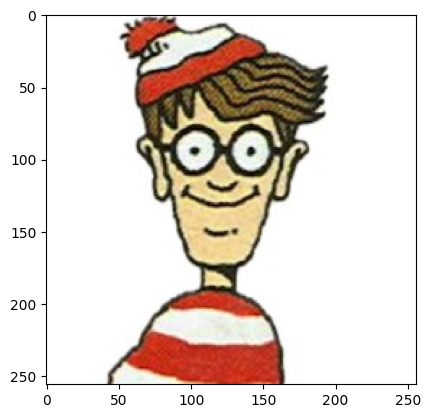

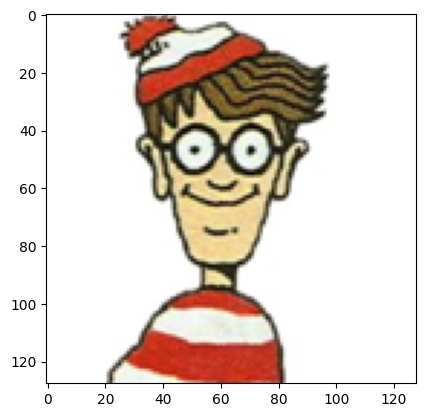

search_feature shape :torch.Size([1, 512, 192, 256])
attention_map shape :torch.Size([1, 1, 189, 253])


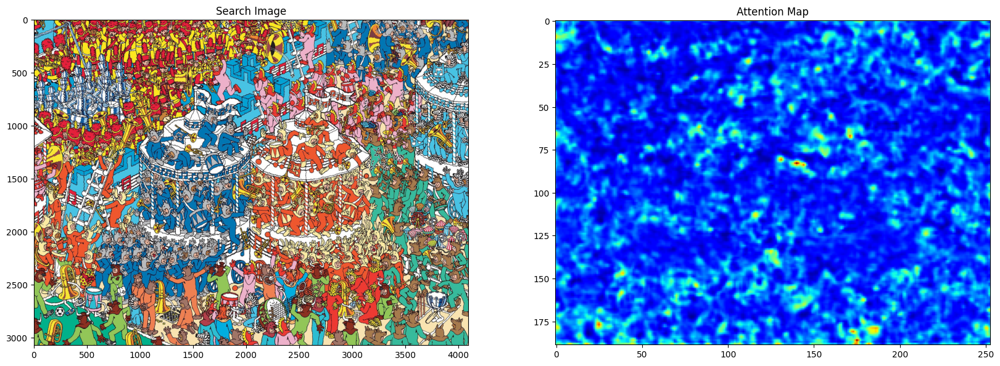

search_feature shape :torch.Size([1, 512, 192, 256])
attention_map shape :torch.Size([1, 1, 189, 253])


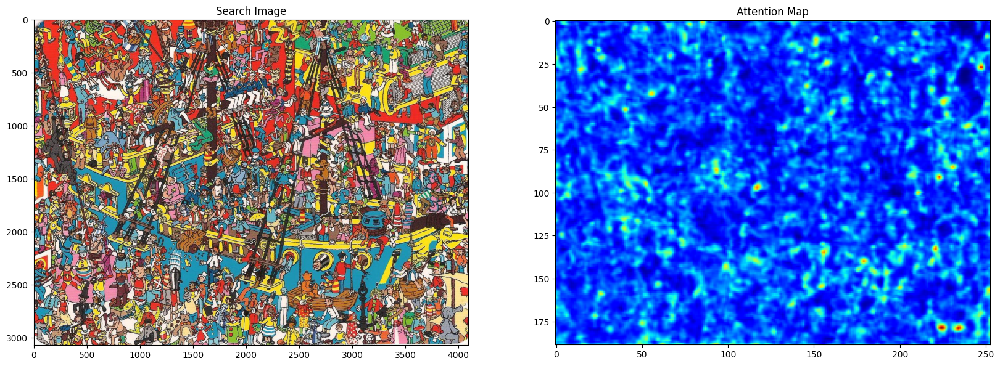

search_feature shape :torch.Size([1, 512, 192, 256])
attention_map shape :torch.Size([1, 1, 189, 253])


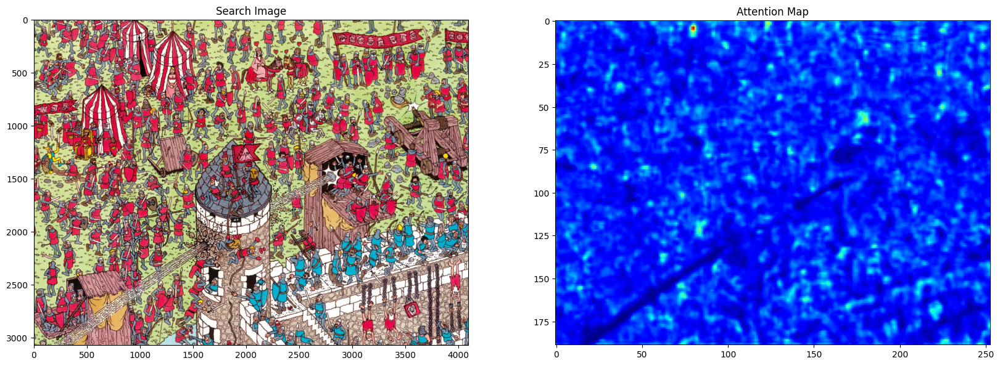

search_feature shape :torch.Size([1, 512, 192, 256])
attention_map shape :torch.Size([1, 1, 189, 253])


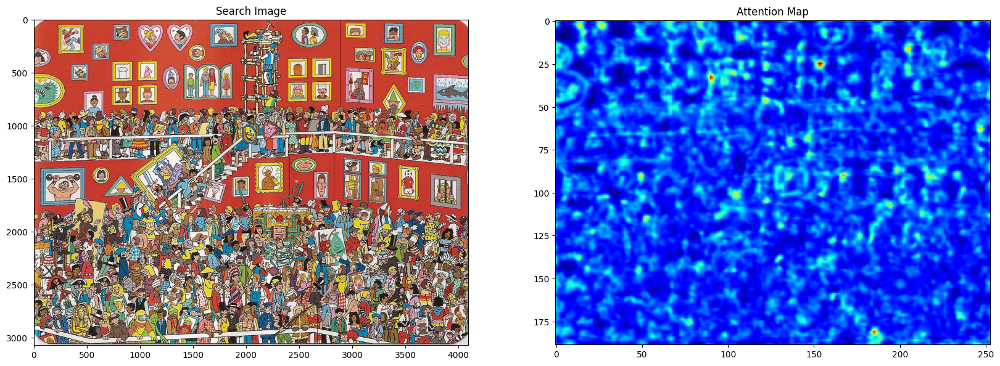

search_feature shape :torch.Size([1, 512, 192, 256])
attention_map shape :torch.Size([1, 1, 189, 253])


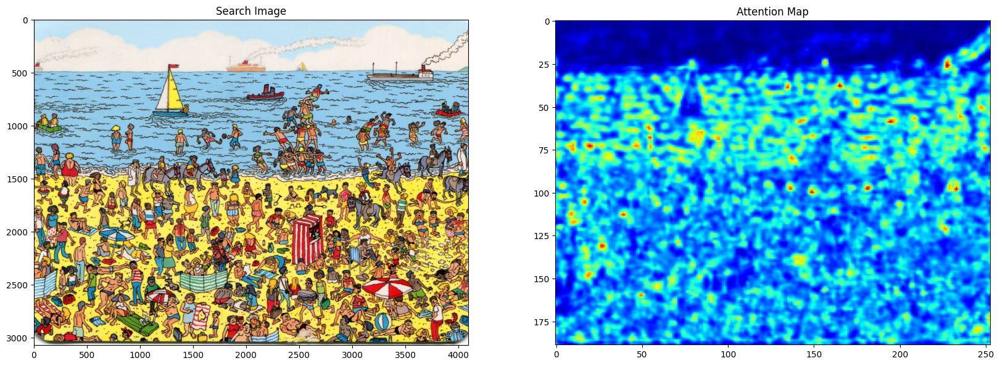

In [13]:
      ###  測試執行第一個Cell  ###
#匯入套件與設定環境
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as f
import torchvision.models as models
import torchvision.transforms as transforms
import requests
from PIL import Image
from google.colab import files
from io import BytesIO

#讀取圖片
def get_image_from_url(url_list):

  image_list = []

  for url in url_list:
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    image_list.append(image)

  return image_list

#調整大小
def resize_image(image, size = (2048, 1536)):

  width, height = image.size
  aspect_ratio = 4 / 3

  #計算4:3的裁剪範圍
  if width / height > aspect_ratio:
    #圖片太寬，以高度為基準計算新寬度
    new_width = int(height * aspect_ratio)
    new_height = height
  else:
    #圖片太高，以寬度為基準計算新高度
    new_width = width
    new_height = int(width / aspect_ratio)

  #計算裁剪的範圍（從中心開始）
  left = (width - new_width) // 2
  top = (height - new_height) // 2
  right = left + new_width
  bottom = top + new_height

  #裁剪4:3區域
  img_cropped = image.crop((left, top, right, bottom))

  #調整大小
  img_resized = img_cropped.resize(size, Image.LANCZOS)

  return img_resized
'''
#圖片分割
def split_image(image, block_size = (64, 64)):

  width, height = image.size
  num_row = height // block_size[1]
  num_col = width // block_size[0]
  block_list = []

  for row in range(num_row):
    for col in range(num_col):
      left = col * block_size[0]   #左上角x座標
      top = row * block_size[1]   #左上角y座標
      right = left + block_size[0]  #右下角x座標
      bottom = top + block_size[1]  #右下角y座標

      #裁剪圖片
      block = image.crop((left, top, right, bottom))
      block_list.append(block)

  return block_list
'''
#轉成tensor
def blocks_to_tensor(block_list):

  tensor_list = []

  for block in block_list:
    tensor = transforms.ToTensor()(block)
    tensor_list.append(tensor)

  batch_tensor = torch.stack(tensor_list)

  return batch_tensor
#定義特徵萃取，針對搜尋區域(Search)和目標物件(Target)
class IVSN_Search(nn.Module):
  def __init__(self, model):
    super(IVSN_Search, self).__init__()
    #取出VGG-16的前30層(包含13層卷積、13層ReLU、4層池化，不取最後一層池化)
    self.features = nn.Sequential(*list(model.children())[0][:30])

    for parameter in self.features.parameters():
      parameter.requires_grad = False #凍結這些層的所有權重，不進行訓練

  def forward(self, x):
    x = self.features(x) #用VGG-16的前30層對輸入影像x萃取特徵
    return x

class IVSN_Target(nn.Module):
  def __init__(self, model):
    super(IVSN_Target, self).__init__()
    #取出VGG-16的前31層(包含最後一層池化)
    self.features = nn.Sequential(*list(model.children())[0][:31])

    for parameter in self.features.parameters():
      parameter.requires_grad = False

  def forward(self, x):
    x = self.features(x)
    return x

#定義模型架構
vgg16 = models.vgg16(pretrained=True)
ivsn_search = IVSN_Search(vgg16).to("cuda")
ivsn_target = IVSN_Target(vgg16).to("cuda")
'''
#產生注意力圖
def generate_attention_map(attention_blocks):

  batch, channel, height, width = attention_blocks.shape
  nr, nc = 6 * 4, 8 * 4

  assert batch == nr * nc, "blocks數量不對"

  grid = attention_blocks.view(nr, nc, channel, height, width)

  col = []

  for i in range(nr):

    row = []

    for j in range(nc):

      row.append(grid[i,j])

    col.append(torch.cat(row, dim = 2))

  attention_map = torch.cat(col, dim = 1)

  return attention_map
'''
ivsn_search.eval()
ivsn_target.eval()

# files.upload()
bg_url_list = {
        "https://raw.githubusercontent.com/Zong0120/Where_is_Waldo/refs/heads/main/2.jpg",
        "https://raw.githubusercontent.com/Zong0120/Where_is_Waldo/refs/heads/main/3.jpg",
        "https://raw.githubusercontent.com/Zong0120/Where_is_Waldo/refs/heads/main/6.jpg",
        "https://raw.githubusercontent.com/Zong0120/Where_is_Waldo/refs/heads/main/7.jpg",
        "https://raw.githubusercontent.com/Zong0120/Where_is_Waldo/refs/heads/main/9.jpg"
       }
bg_lsit = get_image_from_url(bg_url_list)

waldo_url_list = {
        "https://raw.githubusercontent.com/Zong0120/Where_is_Waldo/refs/heads/main/waldo_head.jpg",
        "https://raw.githubusercontent.com/Zong0120/Where_is_Waldo/refs/heads/main/waldo_head_2.jpg"
       }
waldo_list = get_image_from_url(waldo_url_list)

target_size = 128 #威利圖片大小
search_size = 4096 #場景圖片大小

target_image = waldo_list[1]
plt.imshow(target_image)
plt.show()
target_image = target_image.resize((target_size,target_size))
plt.imshow(target_image)
plt.show()
target_tensor = transforms.ToTensor()(target_image).to("cuda").unsqueeze(0) #輸出(1,3,128,128)
target_feature = ivsn_target.forward(target_tensor) #輸出(1,512,4,4)


with torch.no_grad():
  for bg in bg_lsit:
    original_image = bg
    search_image = resize_image(original_image, (search_size, int(search_size / 4 * 3)))
    search_tensor = transforms.ToTensor()(search_image).to("cuda").unsqueeze(0) #輸出(1,3,3072,4096)
    search_feature = ivsn_search.forward(search_tensor) #輸出(1,512,192,256)
    print(f"search_feature shape :{search_feature.shape}")

    attention_map = f.conv2d(search_feature, target_feature) #輸出(1,1,185,249)
    print(f"attention_map shape :{attention_map.shape}")

    attention_map = attention_map.squeeze().cpu().numpy() #輸出(185,249)

    plt.figure(figsize=(20,20))

    plt.subplot(1,2,1)
    plt.title("Search Image")
    plt.imshow(search_image)

    plt.subplot(1,2,2)
    plt.title("Attention Map")
    plt.imshow(attention_map, cmap = "jet")

    plt.show()


In [32]:
#匯入套件與設定環境
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
import scipy.io as sio
import os
import shutil
from PIL import Image
from google.colab import files

In [33]:
#調整大小
def resize_image(image, size = (2048, 1536)):

  width, height = image.size
  aspect_ratio = 4 / 3

  #計算4:3的裁剪範圍
  if width / height > aspect_ratio:
    #圖片太寬，以高度為基準計算新寬度
    new_width = int(height * aspect_ratio)
    new_height = height
  else:
    #圖片太高，以寬度為基準計算新高度
    new_width = width
    new_height = int(width / aspect_ratio)

  #計算裁剪的範圍（從中心開始）
  left = (width - new_width) // 2
  top = (height - new_height) // 2
  right = left + new_width
  bottom = top + new_height

  #裁剪4:3區域
  img_cropped = image.crop((left, top, right, bottom))

  #調整大小
  img_resized = img_cropped.resize(size, Image.LANCZOS)

  return img_resized

In [34]:
#圖片分割
def split_image(image, block_size = (256, 256)):

  width, height = image.size
  num_row = height // block_size[1]
  num_col = width // block_size[0]
  block_list = []

  for row in range(num_row):
    for col in range(num_col):
      left = col * block_size[0]   #左上角x座標
      top = row * block_size[1]   #左上角y座標
      right = left + block_size[0]  #右下角x座標
      bottom = top + block_size[1]  #右下角y座標

      #裁剪圖片
      block = image.crop((left, top, right, bottom))
      block_list.append(block)

  return block_list

In [35]:
#轉成tensor
def blocks_to_tensor(block_list):

  tensor_list = []

  for block in block_list:
    tensor = transforms.ToTensor()(block)
    tensor_list.append(tensor)

  batch_tensor = torch.stack(tensor_list)

  return batch_tensor

In [36]:
#定義特徵萃取，針對搜尋區域(Search)和目標物件(Target)
class IVSN_Search(nn.Module):
  def __init__(self, model):
    super(IVSN_Search, self).__init__()
    #取出VGG-16的前30層(包含13層卷積、13層ReLU、4層池化，不取最後一層池化)
    self.features = nn.Sequential(*list(model.children())[0][:30])

    for parameter in self.features.parameters():
      parameter.requires_grad = False #凍結這些層的所有權重，不進行訓練

  def forward(self, x):
    x = self.features(x) #用VGG-16的前30層對輸入影像x萃取特徵
    return x

class IVSN_Target(nn.Module):
  def __init__(self, model):
    super(IVSN_Target, self).__init__()
    #取出VGG-16的前31層(包含最後一層池化)
    self.features = nn.Sequential(*list(model.children())[0][:31])

    for parameter in self.features.parameters():
      parameter.requires_grad = False

  def forward(self, x):
    x = self.features(x)
    return x

#定義模型架構
vgg16 = models.vgg16(pretrained=True)
ivsn_search = IVSN_Search(vgg16)
ivsn_target = IVSN_Target(vgg16)
print(ivsn_search)
print(ivsn_target)

IVSN_Search(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, di

In [37]:
#產生注意力圖
def generate_attention_map(attention_blocks):

  batch, channel, height, width = attention_blocks.shape
  nr, nc = 6, 8

  assert batch == nr * nc, "blocks數量不對"

  grid = attention_blocks.view(nr, nc, channel, height, width)

  col = []

  for i in range(nr):

    row = []

    for j in range(nc):

      row.append(grid[i,j])

    col.append(torch.cat(row, dim = 2))

  attention_map = torch.cat(col, dim = 1)

  return attention_map
'''
#測試
files.upload()
img = Image.open("waldo.jpg")
img = resize_image(img)
blocks = split_image(img)

tensor = blocks_to_tensor(blocks)
print(f"tensor shape :{tensor.shape}")

map = generate_attention_map(tensor)
print(f"map shape :{map.shape}")

img_np = map.permute(1, 2, 0).numpy()
print(f"img_np shape :{img_np.shape}")

plt.figure(figsize=(12,9))
plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(img)

plt.subplot(1,2,2)
plt.title("Attention Map")
plt.imshow(img_np)

plt.show()
'''

'\n#測試\nfiles.upload()\nimg = Image.open("waldo.jpg")\nimg = resize_image(img)\nblocks = split_image(img)\n\ntensor = blocks_to_tensor(blocks)\nprint(f"tensor shape :{tensor.shape}")\n\nmap = generate_attention_map(tensor)\nprint(f"map shape :{map.shape}")\n\nimg_np = map.permute(1, 2, 0).numpy()\nprint(f"img_np shape :{img_np.shape}")\n\nplt.figure(figsize=(12,9))\nplt.subplot(1,2,1)\nplt.title("Original Image")\nplt.imshow(img)\n\nplt.subplot(1,2,2)\nplt.title("Attention Map")\nplt.imshow(img_np)\n\nplt.show()\n'

search_blocks length :48
search_tensor shape :torch.Size([48, 3, 256, 256])
search_feature shape :torch.Size([48, 512, 16, 16])
attention_blocks shape :torch.Size([48, 1, 16, 16])
attention_map shape :torch.Size([1, 96, 128])


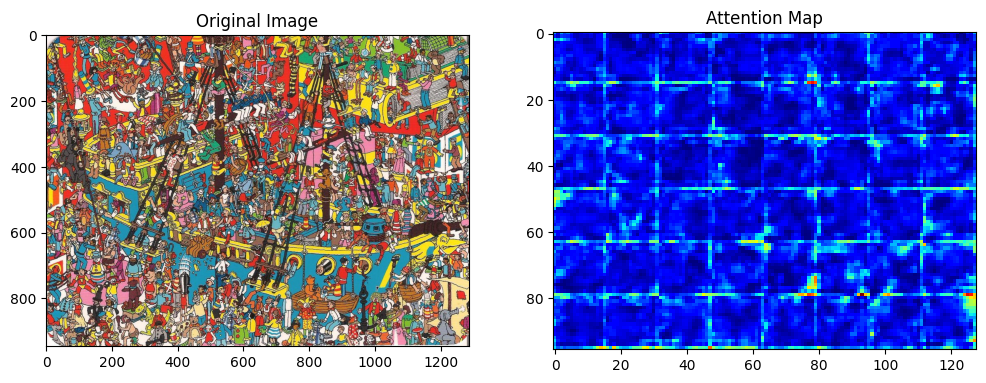

In [44]:
ivsn_search.eval()
ivsn_target.eval()

arr = [2]
# files.upload()

target_image = Image.open("waldo.jpg")
target_image = target_image.resize((32,32))
target_tensor = transforms.ToTensor()(target_image).unsqueeze(0) #輸出(1,3,32,32)
target_feature = ivsn_target.forward(target_tensor) #輸出(1,512,1,1)

with torch.no_grad():
  for i in range(len(arr)):
    original_image = Image.open(f"{arr[i]}.jpg")
    search_image = resize_image(original_image)
    search_blocks = split_image(search_image) #輸出長度48的list，元素為(256,256,3)
    print(f"search_blocks length :{len(search_blocks)}")

    search_tensor = blocks_to_tensor(search_blocks) #輸出(48,3,256,256)
    print(f"search_tensor shape :{search_tensor.shape}")

    search_feature = ivsn_search.forward(search_tensor) #輸出(48,512,16,16)
    print(f"search_feature shape :{search_feature.shape}")

    feature_matching.weight = nn.Parameter(target_feature)

    attention_blocks = feature_matching.forward(search_feature) #輸出(48,1,16,16)
    print(f"attention_blocks shape :{attention_blocks.shape}")

    attention_map = generate_attention_map(attention_blocks) #輸出(1,96,128)
    print(f"attention_map shape :{attention_map.shape}")

    attention_map = attention_map.permute(1, 2, 0).numpy()

    plt.figure(figsize=(12,9))

    plt.subplot(1,2,1)
    plt.title("Original Image")
    plt.imshow(original_image)

    plt.subplot(1,2,2)
    plt.title("Attention Map")
    plt.imshow(attention_map, cmap = "jet")

    plt.show()
